In [2]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from pylab import rcParams
from scipy import stats
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [3]:
data = pd.read_csv("train_cor.csv", sep=",")

In [4]:
data.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Price
count,9987.000000,9987.000000,9987.000000,9987.000000,9987.000000,9987.000000,9987.000000,9987.000000,9987.000000,9987.000000,9987.000000,9987.000000,9987.000000,9987.000000,9987.000000,9987.000000
mean,8382.091619,50.425653,1.887654,56.234092,40.948087,5.877205,8.524782,12.614399,1984.867027,0.118849,24.698508,5354.563633,8.046160,1.319616,4.232202,214088.179046
std,4859.654766,43.599980,0.812724,19.071438,20.971357,5.144954,5.234063,6.770878,18.413963,0.119047,17.531875,4006.621732,23.846091,1.493218,4.807474,92767.166444
min,0.000000,0.000000,0.000000,16.117154,0.641822,0.000000,1.000000,0.000000,1910.000000,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,59174.778028
25%,4167.500000,20.000000,1.000000,41.786338,25.579694,1.000000,4.000000,9.000000,1974.000000,0.017647,6.000000,1564.000000,0.000000,0.000000,1.000000,153903.011790
50%,8393.000000,36.000000,2.000000,52.539711,37.077163,6.000000,7.000000,13.000000,1977.000000,0.075424,25.000000,5285.000000,2.000000,1.000000,3.000000,192277.326489
75%,12591.500000,75.000000,2.000000,65.901823,49.837429,9.000000,12.000000,17.000000,2001.000000,0.195781,36.000000,7227.000000,5.000000,2.000000,6.000000,249105.358586
max,16798.000000,209.000000,5.000000,275.645284,461.463614,123.000000,42.000000,117.000000,2020.000000,0.521867,74.000000,19083.000000,141.000000,6.000000,23.000000,633233.466570


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9987 entries, 0 to 9986
Data columns (total 19 columns):
Id               9987 non-null int64
DistrictId       9987 non-null int64
Rooms            9987 non-null float64
Square           9987 non-null float64
LifeSquare       9987 non-null float64
KitchenSquare    9987 non-null float64
Floor            9987 non-null int64
HouseFloor       9987 non-null float64
HouseYear        9987 non-null int64
Ecology_1        9987 non-null float64
Ecology_2        9987 non-null object
Ecology_3        9987 non-null object
Social_1         9987 non-null int64
Social_2         9987 non-null int64
Social_3         9987 non-null int64
Helthcare_2      9987 non-null int64
Shops_1          9987 non-null int64
Shops_2          9987 non-null object
Price            9987 non-null float64
dtypes: float64(7), int64(9), object(3)
memory usage: 1.4+ MB


In [6]:
data.corr()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Price
Id,1.000000,0.013373,-0.007170,-0.005079,-0.006289,0.009069,0.001461,-0.007901,0.003688,0.018221,-0.000613,-0.001990,-0.009334,0.001626,-0.008755,0.010046
DistrictId,0.013373,1.000000,0.075954,-0.029197,-0.152488,0.186417,-0.121073,-0.149694,-0.200970,0.065113,0.245974,0.167007,0.135931,0.305954,0.173881,0.265670
Rooms,-0.007170,0.075954,1.000000,0.757561,0.522767,0.111280,-0.005066,-0.032659,-0.044379,-0.031734,0.077651,0.072606,0.014281,0.064166,0.054375,0.572903
Square,-0.005079,-0.029197,0.757561,1.000000,0.756013,0.113104,0.118498,0.085496,0.190989,-0.071120,-0.079705,-0.049614,0.022235,-0.032650,0.010639,0.583258
LifeSquare,-0.006289,-0.152488,0.522767,0.756013,1.000000,-0.181557,0.124776,0.048143,0.090365,-0.085276,-0.270819,-0.226097,0.048317,-0.155094,-0.054494,0.298029
KitchenSquare,0.009069,0.186417,0.111280,0.113104,-0.181557,1.000000,-0.011948,0.135617,0.168995,0.017992,0.279106,0.255965,-0.059739,0.154414,0.076791,0.250878
Floor,0.001461,-0.121073,-0.005066,0.118498,0.124776,-0.011948,1.000000,0.420499,0.285467,-0.015668,-0.045887,-0.017429,-0.002117,-0.065270,0.023369,0.127220
HouseFloor,-0.007901,-0.149694,-0.032659,0.085496,0.048143,0.135617,0.420499,1.000000,0.392636,-0.004898,-0.021219,0.006909,-0.008232,-0.068552,0.026384,0.089472
HouseYear,0.003688,-0.200970,-0.044379,0.190989,0.090365,0.168995,0.285467,0.392636,1.000000,-0.066893,-0.047649,0.013954,-0.049302,-0.115766,-0.001691,0.037350
Ecology_1,0.018221,0.065113,-0.031734,-0.071120,-0.085276,0.017992,-0.015668,-0.004898,-0.066893,1.000000,0.026330,0.009155,-0.124232,0.030226,-0.076928,-0.058196


In [7]:
data.loc[:,'Price']

0       184966.930730
1       300009.450063
2       220925.908524
3       175616.227217
4       150226.531644
5       215898.447742
6       296021.204377
7       221244.156664
8       229102.795999
9        95380.220993
10      204243.553129
11      165534.541425
12      229220.372609
13      252481.908323
14      140647.565937
15       89084.327876
16      117000.381287
17      231828.437667
18      183743.230464
19      394895.325987
20      521919.057400
21      127200.026511
22      215083.969056
23      571069.052600
24      241718.099527
25      244145.827069
26      337299.867936
27      173910.923723
28       95338.198549
29      213374.166403
            ...      
9957    220804.817110
9958    228845.682509
9959    222068.370598
9960    197405.312185
9961     65949.315881
9962    190325.071232
9963    175229.645872
9964    174497.101781
9965    185996.664227
9966    339230.931543
9967    203000.197806
9968    242356.408174
9969    177449.715863
9970    164356.212221
9971    22

In [8]:
data.index

RangeIndex(start=0, stop=9987, step=1)

In [9]:
#rcParams["figure.figsize"] = 9, 12
#plt.scatter(data.index, data['Price'])
#plt.show()

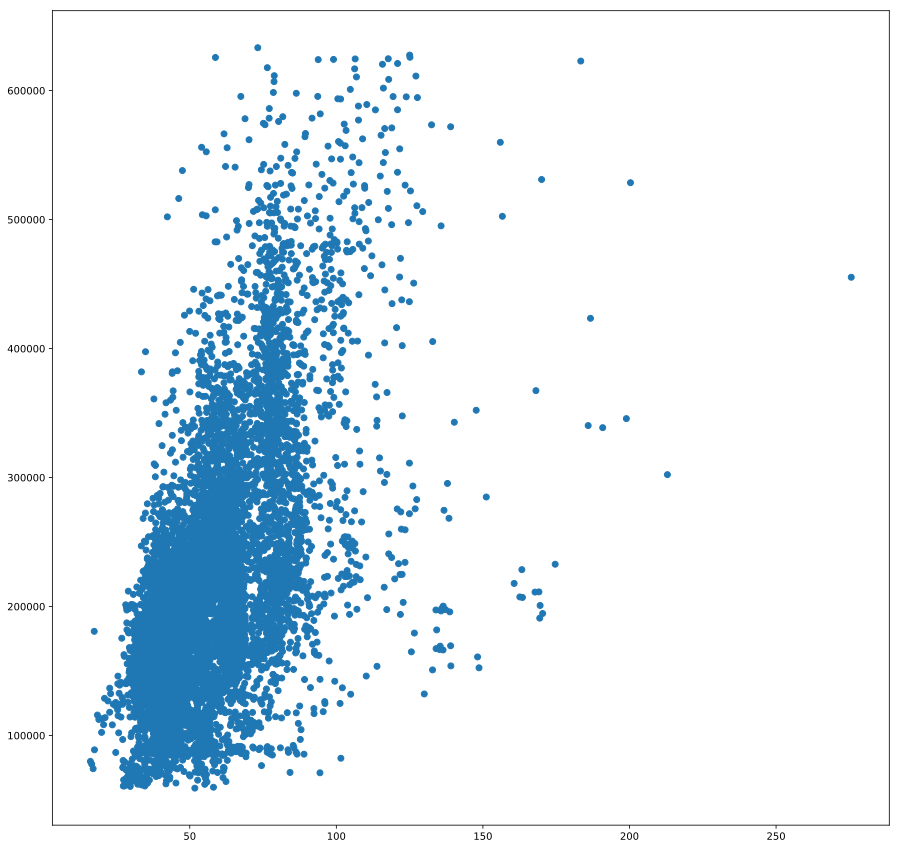

In [10]:
rcParams["figure.figsize"] = 15, 15
plt.scatter(data['Square'], data['Price'])
plt.show()

In [11]:
data.loc[data['Square']>200]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Shops_2,Price
1978,7917,27,0.0,212.932361,211.231125,0.0,2,3.0,2008,0.211401,B,B,9,1892,0,0,1,B,302211.260887
1979,5548,86,5.0,275.645284,233.949309,26.0,12,37.0,2011,0.161976,B,A,31,7010,5,3,7,B,455264.882666
9897,16568,27,4.0,200.334539,201.627361,25.0,1,2.0,2013,0.041116,B,B,53,14892,4,1,4,B,528560.506016


In [12]:
data.drop([1979, 9897], axis=0, inplace=True)

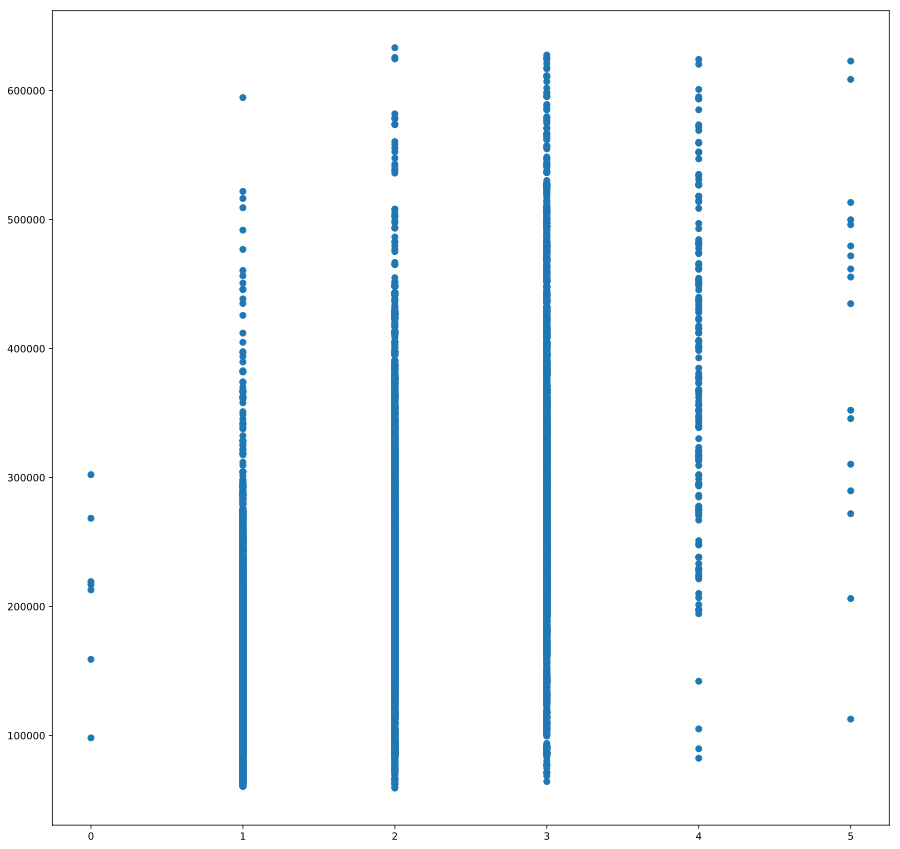

In [13]:
rcParams["figure.figsize"] = 15, 15
plt.scatter(data['Rooms'], data['Price'])
plt.show()

In [14]:
data.loc[data['Rooms']==0]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Shops_2,Price
1395,12638,27,0.0,138.427694,136.215499,0.0,4,3.0,2016,0.075424,B,B,11,3097,0,0,0,B,268394.744389
1978,7917,27,0.0,212.932361,211.231125,0.0,2,3.0,2008,0.211401,B,B,9,1892,0,0,1,B,302211.260887
2266,7317,27,0.0,41.790881,41.790881,0.0,13,0.0,1977,0.211401,B,B,9,1892,0,0,1,B,98129.976788
3906,770,28,0.0,49.483501,49.483501,0.0,16,0.0,2015,0.118537,B,B,30,6207,1,1,0,B,217009.338463
4361,456,6,0.0,81.491446,81.491446,0.0,4,0.0,1977,0.243205,B,B,5,1564,0,0,0,B,212864.799112
6141,3159,88,0.0,38.697117,19.345131,9.0,9,16.0,1982,0.127376,B,B,43,8429,3,3,9,B,158998.110646
8823,9443,27,0.0,87.762616,85.125471,0.0,5,15.0,1977,0.211401,B,B,9,1892,0,0,1,B,219281.918007


In [15]:
data.drop([1395, 1978, 2266, 3906, 4361, 6141, 8823], axis=0, inplace=True)

In [16]:
#rcParams["figure.figsize"] = 15, 15
#plt.scatter(data['Rooms'], data['Price'])
#plt.show()

In [17]:
data.loc[data['Rooms']==5, 'Square']

1420     95.617533
1501    108.057398
3265    121.577423
3268     42.003293
4426     39.906082
4482    183.382273
4756    114.313752
5353    118.871952
5458    112.135525
6614    111.045799
6979    124.933289
8500    198.930182
8648    119.008007
8715     90.762276
8914     85.313605
9420    147.709302
9686    117.855969
Name: Square, dtype: float64

In [18]:
data.drop([3268, 4426], axis=0, inplace=True)

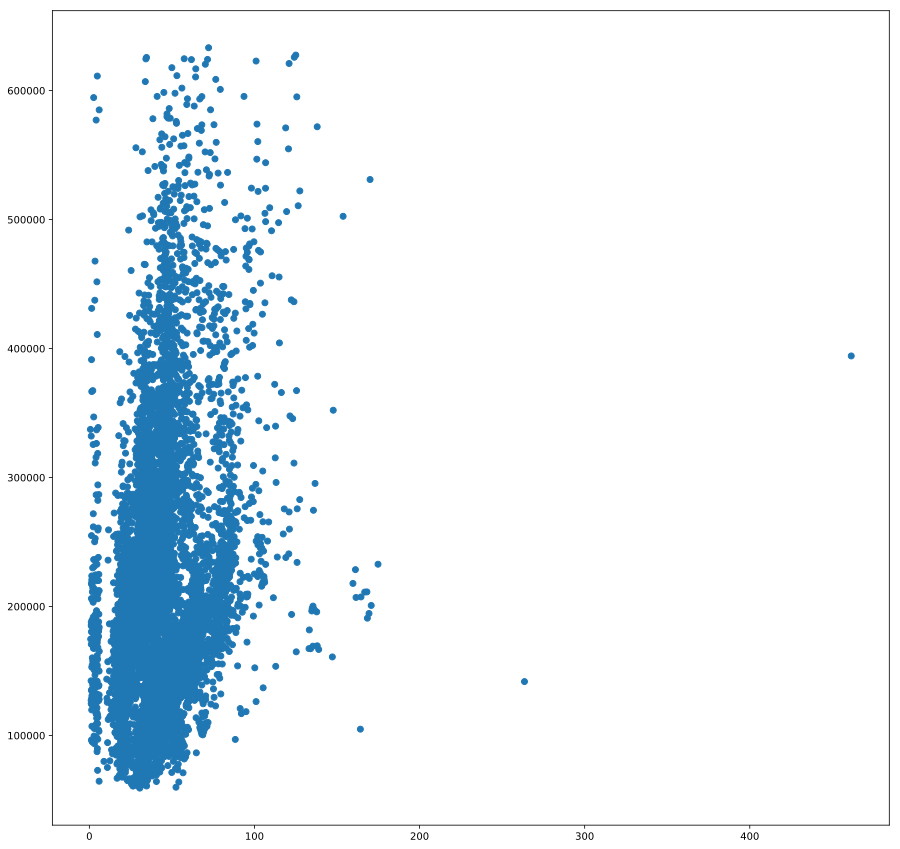

In [19]:
rcParams["figure.figsize"] = 15, 15
plt.scatter(data['LifeSquare'], data['Price'])
plt.show()

In [20]:
data.loc[data['LifeSquare']>190]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Shops_2,Price
589,14990,23,2.0,48.449873,263.542020,5.0,6,5.0,1972,0.075779,B,B,6,1437,3,0,2,B,141780.231857
8426,15886,85,3.0,78.059331,461.463614,10.0,12,16.0,1998,0.037178,B,B,52,11217,1,1,7,B,394253.299978


In [21]:
data.drop([589, 8426], axis=0, inplace=True)

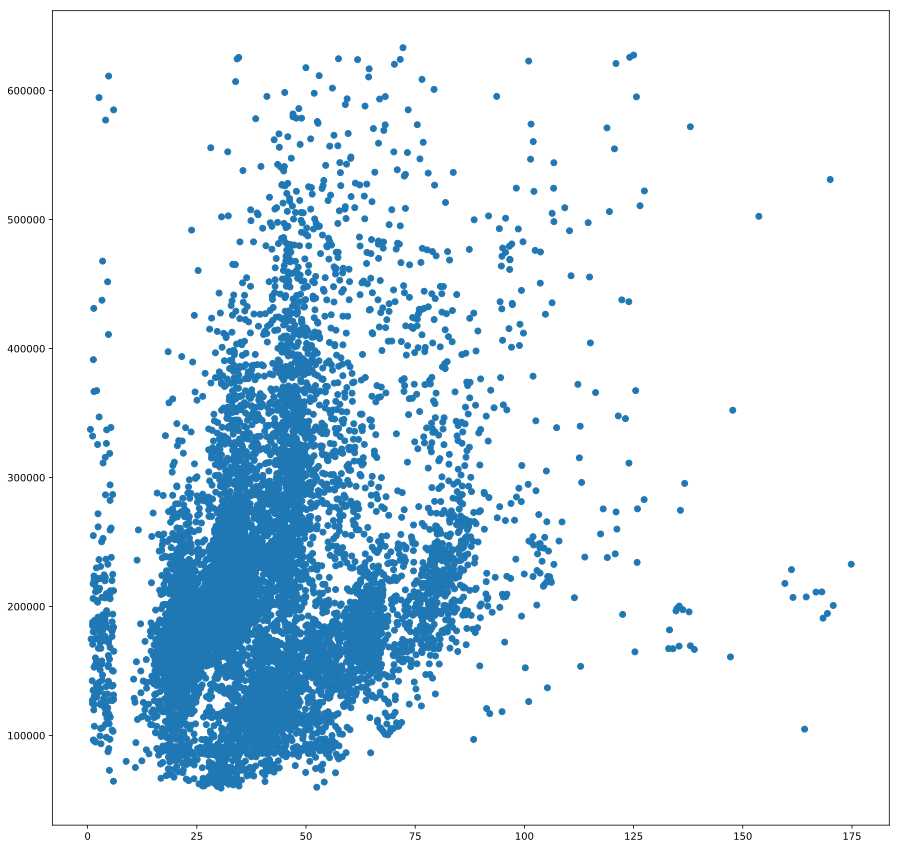

In [22]:
rcParams["figure.figsize"] = 15, 15
plt.scatter(data['LifeSquare'], data['Price'])
plt.show()

In [23]:
data.corr()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Price
Id,1.000000,0.013354,-0.008249,-0.006232,-0.012163,0.008319,0.001858,-0.007882,0.003512,0.018697,-0.000966,-0.002498,-0.009363,0.001855,-0.008894,0.009273
DistrictId,0.013354,1.000000,0.075572,-0.029392,-0.158802,0.186119,-0.121543,-0.151045,-0.201148,0.065277,0.245631,0.166707,0.135867,0.305586,0.173437,0.265881
Rooms,-0.008249,0.075572,1.000000,0.769254,0.541321,0.108765,-0.004835,-0.034974,-0.044581,-0.030465,0.076789,0.071486,0.014231,0.063752,0.053939,0.574546
Square,-0.006232,-0.029392,0.769254,1.000000,0.768610,0.109002,0.122182,0.085460,0.189232,-0.072844,-0.081417,-0.051673,0.023287,-0.032964,0.011175,0.585339
LifeSquare,-0.012163,-0.158802,0.541321,0.768610,1.000000,-0.195321,0.131232,0.050461,0.088977,-0.087571,-0.283902,-0.238135,0.051945,-0.159180,-0.056435,0.300836
KitchenSquare,0.008319,0.186119,0.108765,0.109002,-0.195321,1.000000,-0.012068,0.134106,0.168551,0.018365,0.278330,0.254921,-0.060015,0.153708,0.075989,0.249211
Floor,0.001858,-0.121543,-0.004835,0.122182,0.131232,-0.012068,1.000000,0.420758,0.285836,-0.015729,-0.046245,-0.017574,-0.002221,-0.065766,0.023098,0.127808
HouseFloor,-0.007882,-0.151045,-0.034974,0.085460,0.050461,0.134106,0.420758,1.000000,0.393709,-0.004888,-0.021845,0.006550,-0.008553,-0.069922,0.025387,0.089149
HouseYear,0.003512,-0.201148,-0.044581,0.189232,0.088977,0.168551,0.285836,0.393709,1.000000,-0.066870,-0.048138,0.013422,-0.049215,-0.115912,-0.001591,0.036007
Ecology_1,0.018697,0.065277,-0.030465,-0.072844,-0.087571,0.018365,-0.015729,-0.004888,-0.066870,1.000000,0.026731,0.009580,-0.124254,0.030312,-0.076860,-0.058115


In [24]:
#rcParams["figure.figsize"] = 15, 15
#plt.scatter(data['DistrictId'], data['Price'])
#plt.show()

In [25]:
#rcParams["figure.figsize"] = 15, 15
#plt.scatter(data['Floor'], data['Price'])
#plt.show()

In [26]:
data.loc[data['Floor']>30]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Shops_2,Price
338,11563,8,1.0,50.390862,41.642898,0.0,32,32.0,2008,0.092291,B,B,21,4346,2,1,2,B,97480.845791
2778,1674,76,2.0,74.344672,41.044132,5.0,42,48.0,2016,0.000000,B,B,7,1660,39,1,5,B,411691.504766
3326,3298,31,1.0,57.551691,21.551876,10.0,32,40.0,1977,0.151346,B,A,32,5889,10,4,1,B,393799.531732
4318,6589,30,1.0,62.110823,52.812128,4.0,31,44.0,2009,0.000078,B,B,22,6398,141,3,23,B,117647.461002
6746,8296,146,1.0,86.386754,71.904999,0.0,37,38.0,2012,0.236108,B,B,16,3893,27,3,10,B,269113.584248
8346,8016,31,1.0,59.519896,24.050533,10.0,33,40.0,1977,0.151346,B,A,32,5889,10,4,1,B,389554.063540


In [27]:
#rcParams["figure.figsize"] = 15, 15
#plt.scatter(data['HouseFloor'], data['Price'])
#plt.show()

In [28]:
#rcParams["figure.figsize"] = 15, 15
#plt.scatter(data['HouseYear'], data['Price'])
#plt.show()

In [29]:
#rcParams["figure.figsize"] = 15, 15
#plt.scatter(data['Ecology_1'], data['Price'])
#plt.show()

In [30]:
#rcParams["figure.figsize"] = 15, 15
#plt.scatter(data['Social_1'], data['Price'])
#plt.show()

In [31]:
#rcParams["figure.figsize"] = 15, 15
#plt.scatter(data['Social_2'], data['Price'])
#plt.show()

In [32]:
#rcParams["figure.figsize"] = 15, 15
#plt.scatter(data['Social_3'], data['Price'])
#plt.show()

In [33]:
#rcParams["figure.figsize"] = 15, 15
#plt.scatter(data['Helthcare_2'], data['Price'])
#plt.show()

In [34]:
#rcParams["figure.figsize"] = 15, 15
#plt.scatter(data['Shops_1'], data['Price'])
#plt.show()

In [35]:
tmp = data['Square'] - data['LifeSquare'] + data['KitchenSquare']

In [36]:
tmp.sort_values()

6324   -124.754376
4633     -6.283679
2296     -4.445431
52       -3.824548
9780     -3.786314
5592     -3.755149
3180     -3.745956
1990     -3.726412
2455     -3.472801
1507     -3.427498
9613     -3.396516
7399     -3.390071
4490     -3.375111
9017     -3.299623
9453     -3.204840
9357     -3.191219
2751     -3.179045
2648     -3.175624
4217     -3.169729
7925     -3.153413
9472     -3.110364
2003     -3.087884
8534     -3.070658
235      -2.987205
341      -2.923684
8439     -2.879872
123      -2.851446
8072     -2.837237
6271     -2.796276
1241     -2.728314
           ...    
5532     87.114377
3718     87.923878
6756     88.373377
3426     91.282630
5141     91.348144
3463     92.826306
681      93.251498
6442     94.098730
2913     94.167116
4074     96.186895
4482     97.396767
8476     97.595898
651     102.481525
7079    103.503403
750     103.995239
5486    104.197271
4509    104.447711
6232    106.298918
26      106.317049
226     106.991024
3542    108.380007
2966    114.

In [37]:
#rcParams["figure.figsize"] = 15, 15
#plt.scatter(data.index, tmp.sort_values())
#plt.show()

In [38]:
data.loc[6324]

Id                   8961
DistrictId             27
Rooms                   1
Square             33.399
LifeSquare        164.153
KitchenSquare           6
Floor                   3
HouseFloor              5
HouseYear            1965
Ecology_1        0.211401
Ecology_2               B
Ecology_3               B
Social_1                9
Social_2             1892
Social_3                0
Helthcare_2             0
Shops_1                 1
Shops_2                 B
Price              104891
Name: 6324, dtype: object

In [39]:
data.drop(6324, axis=0, inplace=True)

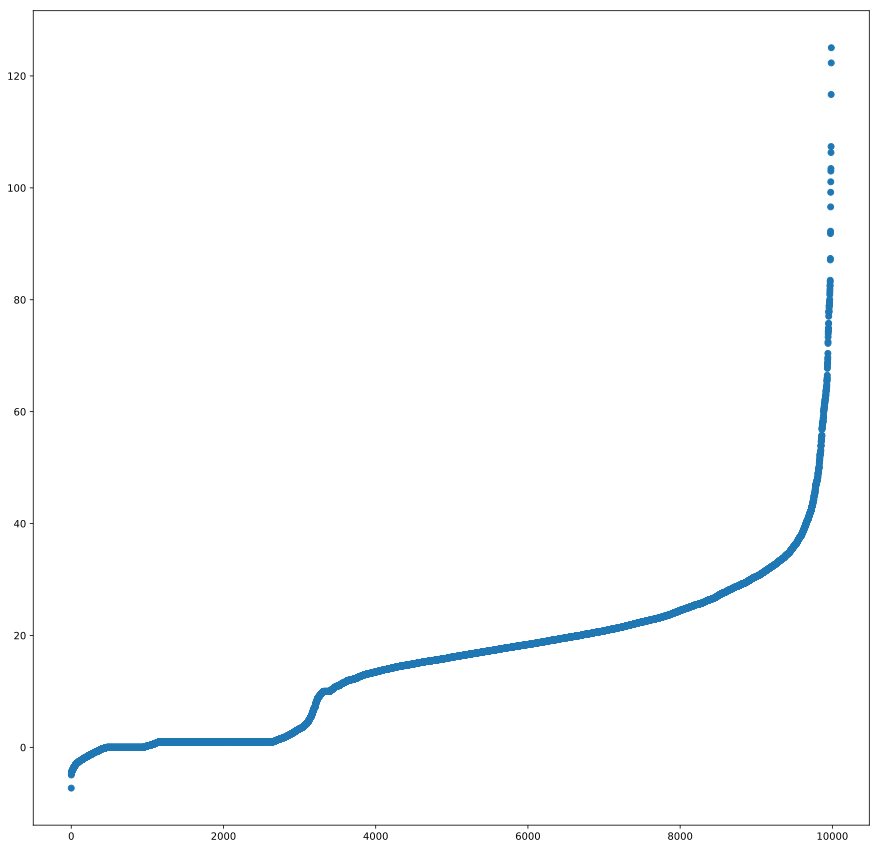

In [40]:
tmp = data['Square'] - data['LifeSquare']
rcParams["figure.figsize"] = 15, 15
plt.scatter(data.index, tmp.sort_values())
plt.show()

In [41]:
tmp.loc[tmp.values > 100]

26      106.317049
750     102.995239
1915    125.041526
3542    107.380007
4509    103.447711
5079    101.076322
9800    116.686747
9815    122.329738
dtype: float64

In [42]:
data.loc[26]

Id                    4378
DistrictId              27
Rooms                    3
Square             106.959
LifeSquare        0.641822
KitchenSquare            0
Floor                   17
HouseFloor               0
HouseYear             2018
Ecology_1        0.0721576
Ecology_2                B
Ecology_3                B
Social_1                 2
Social_2               629
Social_3                 1
Helthcare_2              0
Shops_1                  0
Shops_2                  A
Price               337300
Name: 26, dtype: object

In [43]:
data.loc[data['LifeSquare']<15]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Shops_2,Price
26,4378,27,3.0,106.958871,0.641822,0.0,17,0.0,2018,0.072158,B,B,2,629,1,0,0,A,337299.867936
95,4280,34,2.0,61.334968,4.091945,1.0,26,1.0,2014,0.069753,B,B,53,13670,4,1,11,B,286564.441972
134,12613,6,2.0,65.496674,5.589324,1.0,5,17.0,1977,0.243205,B,B,5,1564,0,0,0,B,180727.643541
158,16779,27,3.0,51.991064,4.896202,1.0,22,25.0,1977,0.072158,B,B,2,629,1,0,0,A,174687.566186
160,3522,6,1.0,66.419841,3.987101,1.0,2,1.0,1977,0.243205,B,B,5,1564,0,0,0,B,193361.229815
218,5354,85,1.0,28.535084,12.733642,6.0,4,9.0,1967,0.037178,B,B,52,11217,1,1,7,B,142269.268090
269,15215,17,1.0,46.692974,5.941401,1.0,7,1.0,2015,0.000000,B,B,18,3374,5,1,2,B,212290.684086
278,8727,1,2.0,79.521221,4.634049,1.0,5,1.0,2017,0.007122,B,B,1,264,0,0,1,B,232726.628137
362,15751,9,1.0,44.171793,1.251846,1.0,11,18.0,2017,0.161532,B,B,25,5648,1,2,4,B,134910.715588
474,6333,27,2.0,64.049695,4.008230,1.0,5,5.0,2017,0.017647,B,B,2,469,0,0,0,B,189477.560210


In [44]:
tmp.loc[tmp.values > 30]

5        33.700759
19       53.963027
20       55.805866
26      106.317049
95       57.243023
101      31.224293
120      41.379645
124      38.801108
132      50.933267
134      59.907351
138      31.912723
150      35.974952
158      47.094862
160      62.432741
175      37.139887
192      37.498505
198      32.228732
207      30.334411
219      31.311457
220      32.535753
226      34.991024
227      31.565409
229      38.295145
259      30.432912
262      30.801080
269      40.751573
273      39.244512
278      74.887172
279      34.089652
281      30.913458
           ...    
9631     32.328003
9634     30.194728
9637     31.999211
9639     33.902367
9651     30.637383
9653     33.844508
9654     32.527618
9655     31.639614
9686     41.294651
9689     32.474493
9699     34.459015
9735     53.947911
9738     31.898847
9743     55.623553
9758     42.275070
9772     32.054293
9775     36.009195
9782     36.752113
9793     32.849137
9800    116.686747
9810     30.471511
9815    122.

In [45]:
tmp = data['Square'] - data['LifeSquare'] - data['KitchenSquare']

In [46]:
tmp.loc[tmp.values > 20]

5        21.700759
12       21.763052
13       20.791246
19       42.963027
20       45.805866
26      106.317049
32       25.403341
95       56.243023
101      21.224293
120      26.379645
124      29.801108
132      38.933267
134      58.907351
138      21.912723
150      23.974952
158      46.094862
160      61.432741
175      36.139887
192      25.498505
196      22.064299
198      22.228732
207      23.334411
214      20.312988
219      25.311457
220      20.535753
222      26.059642
227      21.565409
229      27.295145
259      20.432912
262      21.801080
           ...    
9631     24.328003
9634     21.194728
9637     22.999211
9639     23.902367
9651     20.637383
9653     21.844508
9654     20.527618
9669     20.794584
9686     32.294651
9689     22.474493
9699     22.459015
9735     52.947911
9738     21.898847
9743     54.623553
9758     29.275070
9763     20.067675
9772     22.054293
9775     26.009195
9782     25.752113
9800    115.686747
9815    121.329738
9839     33.

In [47]:
ind = tmp.loc[tmp.values > 20].index
ind

Int64Index([   5,   12,   13,   19,   20,   26,   32,   95,  101,  120,
            ...
            9815, 9839, 9864, 9875, 9909, 9930, 9941, 9976, 9978, 9980],
           dtype='int64', length=1104)

In [48]:
data.drop(ind, axis=0, inplace=True)

In [49]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8869 entries, 0 to 9986
Data columns (total 19 columns):
Id               8869 non-null int64
DistrictId       8869 non-null int64
Rooms            8869 non-null float64
Square           8869 non-null float64
LifeSquare       8869 non-null float64
KitchenSquare    8869 non-null float64
Floor            8869 non-null int64
HouseFloor       8869 non-null float64
HouseYear        8869 non-null int64
Ecology_1        8869 non-null float64
Ecology_2        8869 non-null object
Ecology_3        8869 non-null object
Social_1         8869 non-null int64
Social_2         8869 non-null int64
Social_3         8869 non-null int64
Helthcare_2      8869 non-null int64
Shops_1          8869 non-null int64
Shops_2          8869 non-null object
Price            8869 non-null float64
dtypes: float64(7), int64(9), object(3)
memory usage: 1.4+ MB


In [50]:
data.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Price
count,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000
mean,8379.543917,50.294960,1.801894,53.465896,41.081868,5.600141,8.372985,12.396663,1983.421694,0.119242,24.538843,5299.897170,8.068892,1.309392,4.196076,203149.098274
std,4862.861015,43.329215,0.764200,16.784025,20.145721,5.104982,5.138060,6.638029,17.812538,0.119780,17.454580,3959.175089,23.959372,1.482762,4.799052,80931.708590
min,0.000000,0.000000,1.000000,16.117154,1.626502,0.000000,1.000000,0.000000,1910.000000,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,59174.778028
25%,4143.000000,20.000000,1.000000,41.152322,25.358843,1.000000,4.000000,9.000000,1973.000000,0.017647,6.000000,1564.000000,0.000000,0.000000,1.000000,151391.308723
50%,8401.000000,37.000000,2.000000,49.279171,35.909751,6.000000,7.000000,12.000000,1977.000000,0.075424,25.000000,5285.000000,2.000000,1.000000,3.000000,187685.604356
75%,12619.000000,75.000000,2.000000,62.690057,49.761798,8.000000,12.000000,17.000000,1995.000000,0.195781,36.000000,7227.000000,5.000000,2.000000,5.000000,236557.233238
max,16798.000000,209.000000,5.000000,174.649522,174.837082,123.000000,37.000000,117.000000,2020.000000,0.521867,74.000000,19083.000000,141.000000,6.000000,23.000000,633233.466570


In [51]:
data.corr()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Price
Id,1.000000,0.007999,-0.004163,-0.006873,-0.011827,0.006013,-0.001204,-0.007382,0.000955,0.020827,-0.002710,-0.003489,-0.011010,-0.002014,-0.011983,0.004612
DistrictId,0.007999,1.000000,0.057057,-0.071906,-0.214632,0.182647,-0.136198,-0.167442,-0.200191,0.071696,0.269965,0.189889,0.137290,0.318765,0.178897,0.264971
Rooms,-0.004163,0.057057,1.000000,0.740719,0.559560,0.019158,-0.029169,-0.085718,-0.123134,-0.035835,0.039867,0.031372,0.015360,0.037578,0.030732,0.531862
Square,-0.006873,-0.071906,0.740719,1.000000,0.877910,-0.021359,0.121730,0.049144,0.117233,-0.081300,-0.149024,-0.116762,0.028713,-0.077453,-0.016360,0.524461
LifeSquare,-0.011827,-0.214632,0.559560,0.877910,1.000000,-0.295507,0.160883,0.039809,0.119975,-0.094670,-0.356946,-0.302936,0.055764,-0.204902,-0.084356,0.302944
KitchenSquare,0.006013,0.182647,0.019158,-0.021359,-0.295507,1.000000,-0.027316,0.094438,0.148890,0.021254,0.274558,0.251055,-0.060514,0.151440,0.072240,0.171980
Floor,-0.001204,-0.136198,-0.029169,0.121730,0.160883,-0.027316,1.000000,0.418392,0.285973,-0.023881,-0.066181,-0.033711,0.004668,-0.073674,0.022516,0.120162
HouseFloor,-0.007382,-0.167442,-0.085718,0.049144,0.039809,0.094438,0.418392,1.000000,0.396332,-0.009865,-0.049555,-0.014464,-0.001428,-0.084373,0.024956,0.039386
HouseYear,0.000955,-0.200191,-0.123134,0.117233,0.119975,0.148890,0.285973,0.396332,1.000000,-0.061122,-0.054668,0.009618,-0.035870,-0.116075,0.007940,-0.026494
Ecology_1,0.020827,0.071696,-0.035835,-0.081300,-0.094670,0.021254,-0.023881,-0.009865,-0.061122,1.000000,0.029567,0.013073,-0.126007,0.032174,-0.077116,-0.070369


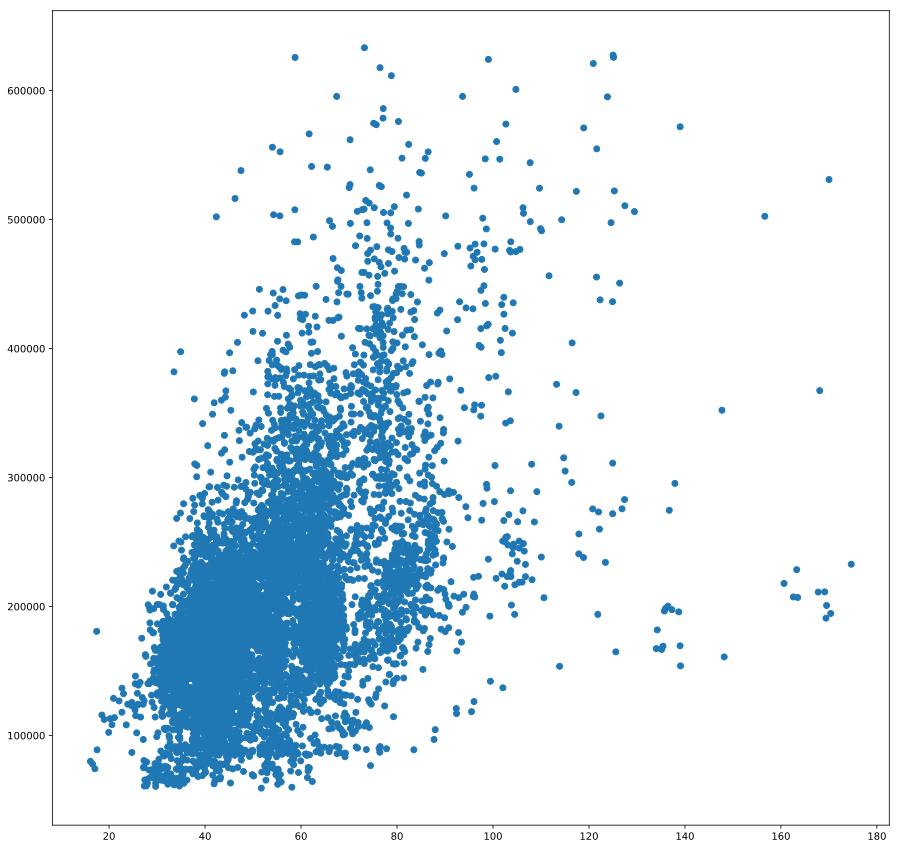

In [52]:
rcParams["figure.figsize"] = 15, 15
plt.scatter(data['Square'], data['Price'])
plt.show()

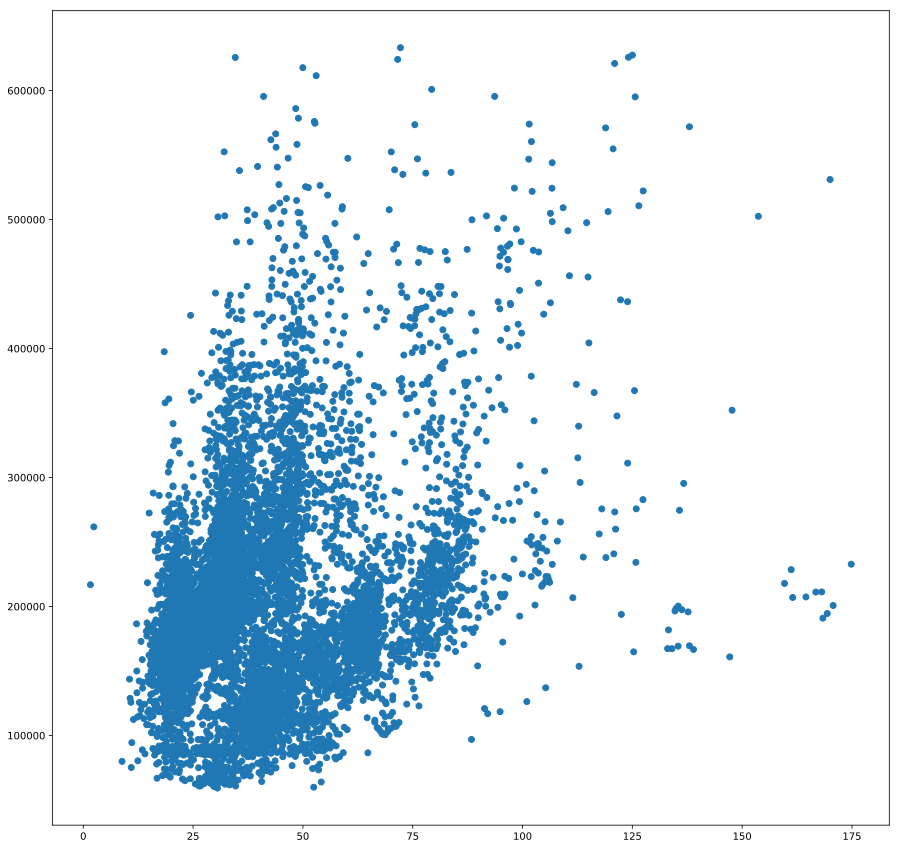

In [53]:
rcParams["figure.figsize"] = 15, 15
plt.scatter(data['LifeSquare'], data['Price'])
plt.show()

In [54]:
#rcParams["figure.figsize"] = 15, 15
#plt.scatter(data['Floor'], data['Price'])
#plt.show()

In [55]:
#rcParams["figure.figsize"] = 15, 15
#plt.scatter(data['DistrictId'], data['Price'])
#plt.show()

In [56]:
data.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Price
count,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000
mean,8379.543917,50.294960,1.801894,53.465896,41.081868,5.600141,8.372985,12.396663,1983.421694,0.119242,24.538843,5299.897170,8.068892,1.309392,4.196076,203149.098274
std,4862.861015,43.329215,0.764200,16.784025,20.145721,5.104982,5.138060,6.638029,17.812538,0.119780,17.454580,3959.175089,23.959372,1.482762,4.799052,80931.708590
min,0.000000,0.000000,1.000000,16.117154,1.626502,0.000000,1.000000,0.000000,1910.000000,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,59174.778028
25%,4143.000000,20.000000,1.000000,41.152322,25.358843,1.000000,4.000000,9.000000,1973.000000,0.017647,6.000000,1564.000000,0.000000,0.000000,1.000000,151391.308723
50%,8401.000000,37.000000,2.000000,49.279171,35.909751,6.000000,7.000000,12.000000,1977.000000,0.075424,25.000000,5285.000000,2.000000,1.000000,3.000000,187685.604356
75%,12619.000000,75.000000,2.000000,62.690057,49.761798,8.000000,12.000000,17.000000,1995.000000,0.195781,36.000000,7227.000000,5.000000,2.000000,5.000000,236557.233238
max,16798.000000,209.000000,5.000000,174.649522,174.837082,123.000000,37.000000,117.000000,2020.000000,0.521867,74.000000,19083.000000,141.000000,6.000000,23.000000,633233.466570


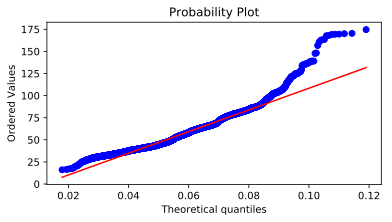

In [57]:
fig, ax = plt.subplots(figsize=(6, 3))

_ = stats.probplot(
    data['Square'],       # data
    sparams=(16.117154, 275.645284),  # guesses at the distribution parameters
    dist=stats.beta,   # the "dist" object
    plot=ax            # where the data should be plotted
)

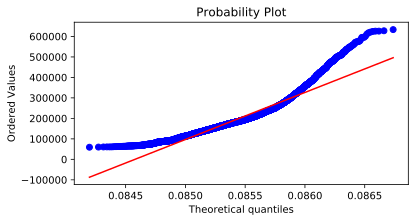

In [63]:
fig, ax = plt.subplots(figsize=(6, 3))

_ = stats.probplot(
    data['Price'],       # data
    sparams=(59174.778028, 633233.466570),  # guesses at the distribution parameters
    dist=stats.beta,   # the "dist" object
    plot=ax            # where the data should be plotted
)

In [76]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

X = data.drop(['Price', 'Ecology_2', 'Ecology_3', 'Shops_2'], axis = 1)
y = data[['Price']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Helthcare_2,Shops_1
0,14038,35,2.0,47.981561,29.442751,6.0,7,9.0,1969,8.903972e-02,33,7976,5,0,11
1,15053,41,3.0,65.683640,40.049543,8.0,7,9.0,1978,6.998930e-05,46,10309,1,1,16
2,4765,53,2.0,44.947953,29.197612,0.0,8,12.0,1968,4.963726e-02,34,7759,0,1,3
3,5809,58,2.0,53.352981,52.731512,9.0,8,17.0,1977,4.378852e-01,23,5735,3,0,5
4,10783,99,1.0,39.649192,23.776169,7.0,11,12.0,1976,1.233889e-02,35,5776,1,2,4
6,14549,154,2.0,62.254114,37.160377,7.0,3,5.0,1960,4.605564e-01,20,4386,14,1,5
7,11993,74,2.0,80.312926,80.312926,0.0,14,0.0,1977,7.577876e-02,6,1437,3,0,2
8,5172,1,2.0,64.511437,63.511437,1.0,9,17.0,1977,7.122317e-03,1,264,0,0,1
9,8649,23,1.0,46.461409,18.915552,8.0,13,17.0,2014,7.577876e-02,6,1437,3,0,2
10,15370,28,2.0,46.304907,27.922584,6.0,8,9.0,1973,1.185374e-01,30,6207,1,1,0


In [77]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
r2_score(y_test, y_pred)

0.49571116913078683

In [75]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(max_depth=12, n_estimators=1000, random_state=42)
model.fit(X_train, y_train.values[:, 0])
y_pred = model.predict(X_test)
r2_score(y_test, y_pred)

0.7134020973454829

In [88]:
import sklearn
sklearn.metrics.SCORERS.keys()

dict_keys(['explained_variance', 'r2', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'accuracy', 'roc_auc', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'brier_score_loss', 'adjusted_rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted'])

In [98]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score


X = data.drop(['Ecology_2', 'Ecology_3', 'Shops_2'], axis = 1)
X = X.loc[data['Rooms'] == 1]
y = X[['Price']]
X = X.drop(['Price'], axis = 1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [99]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
r2_score(y_test, y_pred)

0.4095183437425599

In [100]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score


X = data[['Square']]
y = data[['Price']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [101]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
r2_score(y_test, y_pred)

0.28059519387642884

In [113]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

X = data.loc[data['Rooms'] == 1]
y = X[['Price']]
X

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Shops_2,Price
4,10783,99,1.0,39.649192,23.776169,7.0,11,12.0,1976,0.012339,B,B,35,5776,1,2,4,B,150226.531644
9,8649,23,1.0,46.461409,18.915552,8.0,13,17.0,2014,0.075779,B,B,6,1437,3,0,2,B,95380.220993
14,10953,27,1.0,53.769097,52.408027,1.0,5,4.0,1977,0.072158,B,B,2,629,1,0,0,A,140647.565937
18,2829,57,1.0,44.513481,23.113423,8.0,6,12.0,1983,0.133215,B,B,49,11395,3,3,4,A,183743.230464
22,11852,48,1.0,41.668650,20.207762,10.0,19,22.0,1996,0.041125,B,B,46,9515,5,1,10,B,215083.969056
28,8054,23,1.0,42.530043,43.967759,1.0,3,9.0,2014,0.034656,B,B,0,168,0,0,0,B,95338.198549
31,4785,61,1.0,41.765156,19.343186,9.0,12,16.0,1984,0.300323,B,B,52,10311,6,1,9,B,189007.238944
33,13905,44,1.0,34.767227,18.209648,6.0,7,9.0,1972,0.036122,B,B,24,4378,0,1,1,B,154928.809938
36,11703,23,1.0,41.118766,40.118766,1.0,4,17.0,1977,0.075779,B,B,6,1437,3,0,2,B,103510.223601
47,14292,103,1.0,41.538138,23.292935,8.0,7,16.0,1981,0.014423,B,B,19,3806,4,0,3,B,234052.265527


In [114]:
X.corr()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Price
Id,1.000000,0.003527,NaN,0.031789,0.030601,-0.011363,0.001041,0.003895,-0.004264,0.022834,-0.002831,-0.006064,-0.022928,0.003113,-0.015642,0.010010
DistrictId,0.003527,1.000000,NaN,-0.090873,-0.257434,0.207183,-0.097470,-0.128833,-0.124269,0.080728,0.293180,0.218112,0.091563,0.297391,0.178257,0.312435
Rooms,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Square,0.031789,-0.090873,NaN,1.000000,0.745445,-0.011993,0.169231,0.157582,0.231145,-0.047905,-0.184829,-0.145898,0.035758,-0.097904,-0.024957,0.302703
LifeSquare,0.030601,-0.257434,NaN,0.745445,1.000000,-0.448520,0.166516,0.056500,0.127097,-0.063855,-0.454232,-0.399278,0.086263,-0.256167,-0.115153,0.002086
KitchenSquare,-0.011363,0.207183,NaN,-0.011993,-0.448520,1.000000,-0.013552,0.130785,0.165416,0.026557,0.319037,0.289090,-0.084543,0.186802,0.079701,0.229486
Floor,0.001041,-0.097470,NaN,0.169231,0.166516,-0.013552,1.000000,0.407130,0.249698,-0.017211,-0.046972,-0.025525,0.014438,-0.039442,0.025443,0.121025
HouseFloor,0.003895,-0.128833,NaN,0.157582,0.056500,0.130785,0.407130,1.000000,0.373580,0.003199,-0.028754,-0.000759,0.016105,-0.031130,0.037452,0.107884
HouseYear,-0.004264,-0.124269,NaN,0.231145,0.127097,0.165416,0.249698,0.373580,1.000000,-0.065050,-0.052243,0.000751,-0.009719,-0.079444,0.007338,0.044805
Ecology_1,0.022834,0.080728,NaN,-0.047905,-0.063855,0.026557,-0.017211,0.003199,-0.065050,1.000000,0.037102,0.019679,-0.121806,0.023654,-0.065958,-0.025118


In [111]:
X = X[['Square']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X

,Square
4,39.649192
9,46.461409
14,53.769097
18,44.513481
22,41.668650
28,42.530043
31,41.765156
33,34.767227
36,41.118766
47,41.538138


In [108]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
r2_score(y_test, y_pred)

0.13138667947934524